# Plot codes for *Quantum-enhanced radio-frequency photonic distributed imaging*

# Libraries

In [ ]:
%matplotlib inline
import scienceplots
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d, convolve
from skimage import color, data, restoration, exposure
from skimage import io
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams.update({'font.size': 16})



# Plot code

In [17]:
w0=1
Fontsize=15

# only work for adaptive grids

def myplotPSNR(filenameString,plotnameString):
  filename=filenameString+'.npz'
  # dm=np.load(filename)['dm']
  Glist=np.load(filename)['Glist']
  psnr=np.load(filename)['psnr']
  gr_list=np.load(filename)['gr_list']
  f_bp_list=np.load(filename)['f_bp_list']
  # metric_list=np.load(filename)['metric_list']
  Ypixelwidth_list=np.load(filename)['Ypixelwidth_list']
  dist_pixel=np.load(filename)['dist_pixel']
  d_list=dist_pixel*Ypixelwidth_list

  range_list=np.load(filename)['r']

  plt.style.use(['science','nature','no-latex'])
  plt.rcParams['figure.dpi'] = 300
  # plt.rcParams['figure.figsize'] = [5, 3]

  # plt.figure(1)
  # plt.plot(Glist,dm)
  # plt.xlabel('G')
  # plt.ylabel('$d_m/w_0$')
  # plt.show()

  print("PSNR:")
  plt.figure(2)
  Levels=range(5,25+1)
  LineLevels=range(9,25+1)
  plt.contourf(d_list[0:-2]/w0,10*np.log10(Glist),psnr[:,0:-2],levels=Levels)
  cs=plt.contour(d_list[0:-2]/w0,10*np.log10(Glist),psnr[:,0:-2],levels=Levels)
  ax=plt.gca()
  ax.clabel(cs,levels=LineLevels,colors='white',inline=False,fontsize=Fontsize-3)
  cb=plt.colorbar()
  cb.remove()
  plt.tick_params(axis='x', labelsize=Fontsize)
  plt.tick_params(axis='y', labelsize=Fontsize)
  plt.xlabel('$d/w_0$',fontsize=Fontsize)
  plt.ylabel('$G$(dB)',fontsize=Fontsize)
  plt.savefig(plotnameString+'_psnr.png',dpi=300, bbox_inches='tight')
  plt.show()

  # print("Resolvability:")
  # plt.figure(3)
  # plt.contourf(d_list,Glist,metric_list)
  # plt.xlabel('$d/w_0$')
  # plt.ylabel('$G$')
  # plt.show()



def myplot(filenameString,plotnameString):
  filename=filenameString+'.npz'
  # dm=np.load(filename)['dm']
  Glist=np.load(filename)['Glist']
  psnr=np.load(filename)['psnr']
  gr_list=np.load(filename)['gr_list']
  f_bp_list=np.load(filename)['f_bp_list']
  # metric_list=np.load(filename)['metric_list']
  Ypixelwidth_list=np.load(filename)['Ypixelwidth_list']
  dist_pixel=np.load(filename)['dist_pixel']
  d_list=dist_pixel*Ypixelwidth_list

  range_list=np.load(filename)['r']

  plt.style.use(['science','nature','no-latex'])
  plt.rcParams['figure.dpi'] = 300
  # plt.rcParams['figure.figsize'] = [5, 3]

  # plt.figure(1)
  # plt.plot(Glist,dm)
  # plt.xlabel('G')
  # plt.ylabel('$d_m/w_0$')
  # plt.show()

  print("PSNR:")
  plt.figure(2)
  cs=plt.contourf(10*np.log10(d_list[0:-2]),10*np.log10(Glist),psnr[:,0:-2])
  # plt.clabel(cs)
  cb=plt.colorbar()
  # cb.remove()
  plt.tick_params(axis='x', labelsize=Fontsize)
  plt.tick_params(axis='y', labelsize=Fontsize)
  plt.xlabel('$d/w_0$(dB)',fontsize=Fontsize)
  plt.ylabel('$G$(dB)',fontsize=Fontsize)
  plt.savefig(plotnameString+'_psnr.png',dpi=100, bbox_inches='tight')
  plt.show()

  # print("Resolvability:")
  # plt.figure(3)
  # plt.contourf(d_list,Glist,metric_list)
  # plt.xlabel('$d/w_0$')
  # plt.ylabel('$G$')
  # plt.show()


  print("Raw images:")
  plt.figure(4)

  plot_xdim=int(np.ceil(len(d_list)/2))
  dist_idx_list=range(0,plot_xdim*2,2)
  # plot_ydim=int(np.ceil(len(Glist)/2))
  # G_idx_list=range(0,plot_ydim*2,2)
  plot_ydim=len(Glist)
  G_idx_list=range(0,plot_ydim*1,1)

  fig4, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(20,16))
  plt.tight_layout(pad=1.0)


  for k in range(plot_ydim):
    for m in range(plot_xdim):

      (dist_idx, G_idx)=(dist_idx_list[m],G_idx_list[k])

      xrange=range_list[dist_idx][0]
      yrange=range_list[dist_idx][1]
      x,y=np.meshgrid(xrange,yrange)
      G=Glist[G_idx]

      # halfdist=int(dist_psnr/2)
      # f=np.zeros(np.shape(x));
      # f[int(len(f)/2)-halfdist,int(len(f)/2)] += np.sqrt(photon/2);
      # f[int(len(f)/2)+halfdist,int(len(f)/2)] += np.sqrt(photon/2);

      Xpixelwidth=xrange[1]-xrange[0]
      Ypixelwidth=yrange[1]-yrange[0]

      # plt.subplot(plot_ydim,plot_xdim,k*plot_xdim+m+1)
      z=gr_list[G_idx,dist_idx]
      z=z/np.max(np.abs(z))
      axs[k,m].contourf(x/w0,y/w0,z,vmin=-1,vmax=1)
      axs[k,m].set_title('$G=%i dB$, $d/w_0=%i dB$'%(10*np.log10(G),np.round(10*np.log10(dist_pixel*Ypixelwidth/w0))),fontsize=10)
      axs[k,m].set_xlabel('$x/w_0$',fontsize=10)
      axs[k,m].set_ylabel('$y/w_0$',fontsize=10)
      axs[k,m].tick_params(axis='x', labelsize=10)
      axs[k,m].tick_params(axis='y',labelsize=10)
      axs[k,m].set_aspect(Xpixelwidth/Ypixelwidth)
      # axs[k,m].axis('square')


  fig4.savefig(plotnameString+'_rawImage.png',dpi=100)
  plt.show()


  print("Recovered images:")
  plt.figure()
  fig, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(20,16))
  plt.tight_layout(pad=1.0)


  for k in range(plot_ydim):
    for m in range(plot_xdim):


      (dist_idx, G_idx)=(dist_idx_list[m],G_idx_list[k])

      xrange=range_list[dist_idx][0]
      yrange=range_list[dist_idx][1]
      x,y=np.meshgrid(xrange,yrange)
      G=Glist[G_idx]

      # halfdist=int(dist_psnr/2)
      # f=np.zeros(np.shape(x));
      # f[int(len(f)/2)-halfdist,int(len(f)/2)] += np.sqrt(photon/2);
      # f[int(len(f)/2)+halfdist,int(len(f)/2)] += np.sqrt(photon/2);

      Xpixelwidth=xrange[1]-xrange[0]
      Ypixelwidth=yrange[1]-yrange[0]

      # plt.subplot(plot_ydim,plot_xdim,k*plot_xdim+m+1)
      z=f_bp_list[G_idx,dist_idx]
      z=z/np.max(np.abs(z))
      axs[k,m].contourf(x/w0,y/w0,z,vmin=-1,vmax=1)
      axs[k,m].set_title('$G=%i dB$, $d/w_0=%i dB$'%(10*np.log10(G),np.round(10*np.log10(dist_pixel*Ypixelwidth/w0))),fontsize=10)
      axs[k,m].set_xlabel('$x/w_0$',fontsize=10)
      axs[k,m].set_ylabel('$y/w_0$',fontsize=10)
      axs[k,m].tick_params(axis='x', labelsize=10)
      axs[k,m].tick_params(axis='y',labelsize=10)
      axs[k,m].set_aspect(Xpixelwidth/Ypixelwidth)
      # axs[k,m].axis('square')


  fig.savefig(plotnameString+'.png',dpi=100)
  plt.show()







In [18]:
w0=1

# only work for adaptive grids
# plot only 6 x 6 subplots

def myplot_6x6(filenameString,plotnameString):



  FontSize=18
  filename=filenameString+'.npz'
  # dm=np.load(filename)['dm']
  Glist=np.load(filename)['Glist'][0::2]
  psnr=np.load(filename)['psnr'][0::2,0::4]
  gr_list=np.load(filename)['gr_list'][0::2,0::4]
  f_bp_list=np.load(filename)['f_bp_list'][0::2,0::4]
  # metric_list=np.load(filename)['metric_list']
  Ypixelwidth_list=np.load(filename)['Ypixelwidth_list'][0::4]
  dist_pixel=np.load(filename)['dist_pixel']
  d_list=dist_pixel*Ypixelwidth_list
  range_list=np.load(filename)['r'][0::4]



  plt.rcParams['figure.figsize'] = [5, 3]

  # plt.figure(1)
  # plt.plot(Glist,dm)
  # plt.xlabel('G')
  # plt.ylabel('$d_m/w_0$')
  # plt.show()

  print("PSNR:")
  print("x:d=",dlist)
  print("y:G=",Glist)
  print("PSNR=",psnr)
  plt.figure(2)
  plt.pcolormesh(10*np.log10(d_list),10*np.log10(Glist),psnr)
  plt.xlabel('$d/w_0$(dB)')
  plt.ylabel('$G$(dB)')
  plt.colorbar()
  plt.savefig(plotnameString+'_psnr_6x6.png',dpi=100, bbox_inches='tight')
  plt.show()

  # print("Resolvability:")
  # plt.figure(3)
  # plt.contourf(d_list,Glist,metric_list)
  # plt.xlabel('$d/w_0$')
  # plt.ylabel('$G$')
  # plt.show()



  print("Raw images:")
  plot_xdim=int(np.ceil(len(d_list)/1))
  dist_idx_list=range(0,plot_xdim*1,1)
  # plot_ydim=int(np.ceil(len(Glist)/2))
  # G_idx_list=range(0,plot_ydim*2,2)
  plot_ydim=len(Glist)
  G_idx_list=range(0,plot_ydim*1,1)


  def subplots(data):
    plt.figure()
    # fig, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(16,16),gridspec_kw=dict(hspace=0,wspace=0),sharex=True, sharey= True)
    fig, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(16,16),gridspec_kw=dict(hspace=0,wspace=0))
    # plt.tight_layout(pad=0.0)
    for k in range(plot_ydim):
      for m in range(plot_xdim):

        (dist_idx, G_idx)=(dist_idx_list[m],G_idx_list[k])

        xrange=range_list[dist_idx][0]
        yrange=range_list[dist_idx][1]
        x,y=np.meshgrid(xrange,yrange)
        G=Glist[G_idx]

        # halfdist=int(dist_psnr/2)
        # f=np.zeros(np.shape(x));
        # f[int(len(f)/2)-halfdist,int(len(f)/2)] += np.sqrt(photon/2);
        # f[int(len(f)/2)+halfdist,int(len(f)/2)] += np.sqrt(photon/2);

        Xpixelwidth=xrange[1]-xrange[0]
        Ypixelwidth=yrange[1]-yrange[0]

        # plt.subplot(plot_ydim,plot_xdim,k*plot_xdim+m+1)
        z=data[G_idx,dist_idx]
        z=z/np.max(np.abs(z))
        axs[k,m].contourf(x/(Xpixelwidth*dist_pixel),y/(Ypixelwidth*dist_pixel),z,vmin=-1,vmax=1)
        # axs[k,m].set_title('$G=%i dB$, $d/w_0=%i dB$'%(10*np.log10(G),np.round(10*np.log10(dist_pixel*Ypixelwidth/w0))),fontsize=FontSize)
        axs[k,m].tick_params(axis='x', labelsize=FontSize)
        axs[k,m].tick_params(axis='y',labelsize=FontSize)
        axs[k,m].set_aspect(Xpixelwidth/Ypixelwidth)
        # axs[k,m].axis('square')
        axs[k,m].set_xticks([])
        axs[k,m].set_yticks([])

        if k==plot_ydim-1 and m==0:
          axs[k,m].set_xlabel('$x/d$',fontsize=FontSize)
          axs[k,m].set_ylabel('$y/d$',fontsize=FontSize)
          axs[k,m].set_xticks([-0.5,0,0.5])
          axs[k,m].set_yticks([-0.5,0,0.5])
        # else:
        #   axs[k,m].set_xticks([])
        #   axs[k,m].set_yticks([])

    plt.show()
    return fig

  data=gr_list
  fig=subplots(data)
  fig.savefig(plotnameString+'_rawImage_6x6.png',dpi=100)



  print("Recovered images:")
  data=f_bp_list
  fig=subplots(data)
  fig.savefig(plotnameString+'_6x6.png',dpi=100)


In [19]:
w0=1
FontSize=25

# only work for adaptive grids
# plot only 6 x 6 subplots  with denser d

def myplot_6x6_denserd(filenameString,plotnameString):




  filename=filenameString+'.npz'
  # dm=np.load(filename)['dm']
  Glist=np.load(filename)['Glist'][0::2]
  psnr=np.load(filename)['psnr'][0::2,0:-4:3]
  gr_list=np.load(filename)['gr_list'][0::2,0:-4:3]
  f_bp_list=np.load(filename)['f_bp_list'][0::2,0:-4:3]
  # metric_list=np.load(filename)['metric_list']
  Ypixelwidth_list=np.load(filename)['Ypixelwidth_list'][0:-4:3]
  dist_pixel=np.load(filename)['dist_pixel']
  d_list=dist_pixel*Ypixelwidth_list
  range_list=np.load(filename)['r'][0:-4:3]



  plt.rcParams['figure.figsize'] = [5, 3]

  # plt.figure(1)
  # plt.plot(Glist,dm)
  # plt.xlabel('G')
  # plt.ylabel('$d_m/w_0$')
  # plt.show()

  print("PSNR:")
  print("x:d=",d_list)
  print("y:G=",Glist)
  print("PSNR=",psnr)
  plt.figure(2)
  plt.pcolormesh(10*np.log10(d_list),10*np.log10(Glist),psnr)
  plt.xlabel('$d/w_0$(dB)')
  plt.ylabel('$G$(dB)')
  plt.colorbar()
  plt.savefig(plotnameString+'_psnr_6x6.png',dpi=100, bbox_inches='tight')
  plt.show()

  # print("Resolvability:")
  # plt.figure(3)
  # plt.contourf(d_list,Glist,metric_list)
  # plt.xlabel('$d/w_0$')
  # plt.ylabel('$G$')
  # plt.show()



  print("Raw images:")
  plot_xdim=int(np.ceil(len(d_list)/1))
  dist_idx_list=range(0,plot_xdim*1,1)
  # plot_ydim=int(np.ceil(len(Glist)/2))
  # G_idx_list=range(0,plot_ydim*2,2)
  plot_ydim=len(Glist)
  G_idx_list=range(0,plot_ydim*1,1)


  def subplots(data):
    plt.figure()
    # fig, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(16,16),gridspec_kw=dict(hspace=0,wspace=0),sharex=True, sharey= True)
    fig, axs = plt.subplots(plot_ydim,plot_xdim,figsize=(16*plot_xdim/plot_ydim,16),gridspec_kw=dict(hspace=0,wspace=0))
    # plt.tight_layout(pad=0.0)
    for k in range(plot_ydim):
      for m in range(plot_xdim):

        (dist_idx, G_idx)=(dist_idx_list[m],G_idx_list[k])

        xrange=range_list[dist_idx][0]
        yrange=range_list[dist_idx][1]
        x,y=np.meshgrid(xrange,yrange)
        G=Glist[G_idx]

        # halfdist=int(dist_psnr/2)
        # f=np.zeros(np.shape(x));
        # f[int(len(f)/2)-halfdist,int(len(f)/2)] += np.sqrt(photon/2);
        # f[int(len(f)/2)+halfdist,int(len(f)/2)] += np.sqrt(photon/2);

        Xpixelwidth=xrange[1]-xrange[0]
        Ypixelwidth=yrange[1]-yrange[0]

        # plt.subplot(plot_ydim,plot_xdim,k*plot_xdim+m+1)
        z=data[G_idx,dist_idx]
        z=z/np.max(np.abs(z))
        axs[k,m].contourf(x/(Xpixelwidth*dist_pixel),y/(Ypixelwidth*dist_pixel),z,vmin=-1,vmax=1)
        # axs[k,m].set_title('$G=%i dB$, $d/w_0=%i dB$'%(10*np.log10(G),np.round(10*np.log10(dist_pixel*Ypixelwidth/w0))),fontsize=FontSize)
        axs[k,m].tick_params(axis='x', labelsize=FontSize)
        axs[k,m].tick_params(axis='y',labelsize=FontSize)
        axs[k,m].set_aspect(Xpixelwidth/Ypixelwidth)
        # axs[k,m].axis('square')
        axs[k,m].set_xticks([])
        axs[k,m].set_yticks([])

        if k==plot_ydim-1 and m==0:
          axs[k,m].set_xlabel('$x/d$',fontsize=FontSize)
          axs[k,m].set_ylabel('$y/d$',fontsize=FontSize)
          axs[k,m].set_xticks([-0.5,0,0.5])
          axs[k,m].set_yticks([-0.5,0,0.5])
        # else:
        #   axs[k,m].set_xticks([])
        #   axs[k,m].set_yticks([])

    plt.show()
    return fig

  data=gr_list
  fig=subplots(data)
  fig.savefig(plotnameString+'_rawImage_6x6.png',dpi=100)



  print("Recovered images:")
  data=f_bp_list
  fig=subplots(data)
  fig.savefig(plotnameString+'_6x6.png',dpi=100)


## PSNR Plot

### Noiseless

In [1]:
photon=100
Nbprime=0.0

filenameString_list=[
'data/test_binary_coh_quantum_bp_dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

plotnameString_list=[
'plots/dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

for idx in range(len(filenameString_list)):
  myplotPSNR(filenameString_list[idx],plotnameString_list[idx])

NameError: name 'myplotPSNR' is not defined

### Noisy

PSNR:


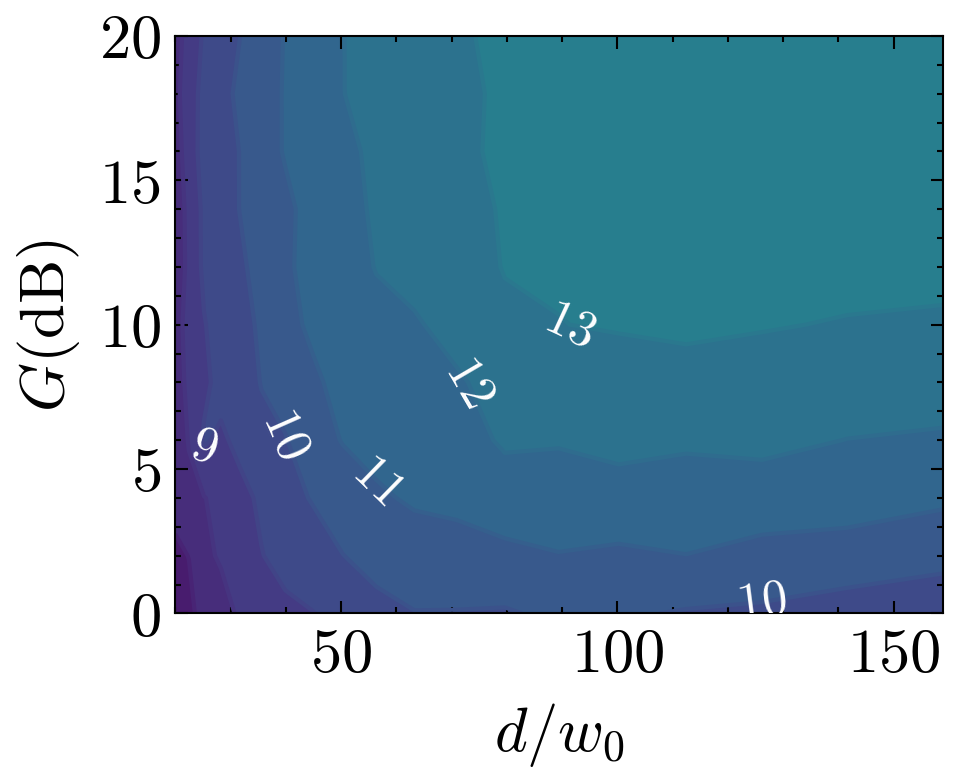

In [25]:
photon=100
Nbprime=0.1

filenameString_list=[
'data/test_binary_coh_quantum_bp_dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

plotnameString_list=[
'plots/dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

for idx in range(len(filenameString_list)):
  myplotPSNR(filenameString_list[idx],plotnameString_list[idx])

## 6 x 6 plot

### Noiseless

PSNR:
x:d= [ 20.          28.25075089  39.9052463   56.36765863  79.62143411
 112.46826504]
y:G= [  1.           2.51188643   6.30957344  15.84893192  39.81071706
 100.        ]
PSNR= [[ 6.29767966  7.86560059  8.893268   10.11318218 10.34869771 10.37440141]
 [ 7.39404968  9.14294452 10.32876632 11.31150605 12.27808049 12.42555072]
 [ 7.69053682  9.71051008 11.23345851 12.53438289 13.72513075 14.24493145]
 [ 8.00865142 10.32746185 11.9210037  13.51116552 14.8055018  15.64598964]
 [ 7.34605086 10.66071634 12.46551949 14.2148554  15.61170356 16.788948  ]
 [ 6.62272226 10.59030972 12.90864016 14.67469496 16.24284754 17.61591124]]


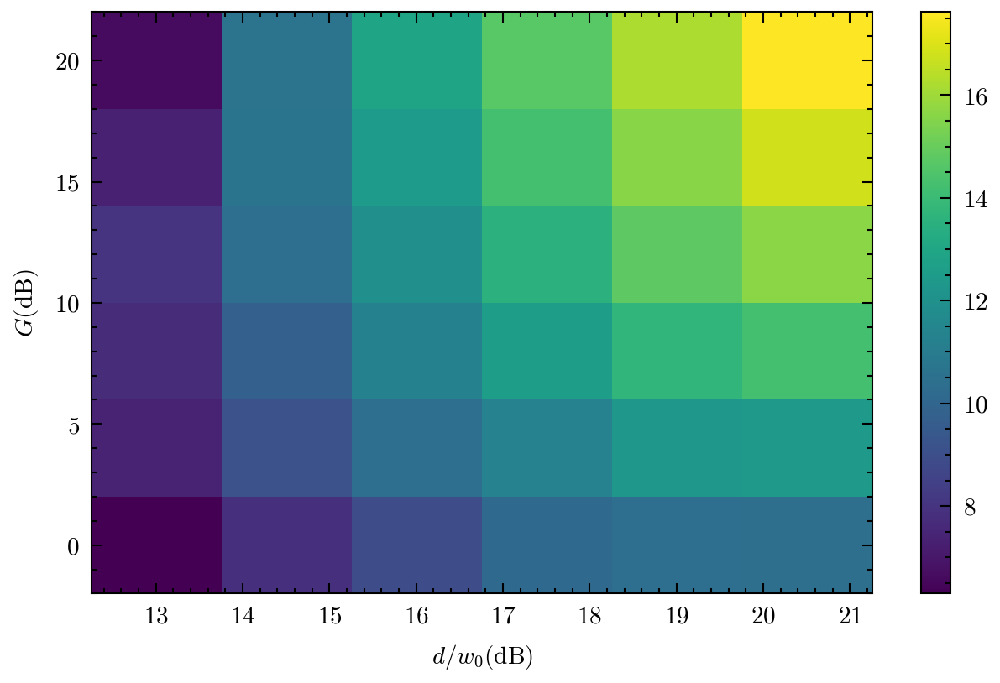

Raw images:


<Figure size 1500x900 with 0 Axes>

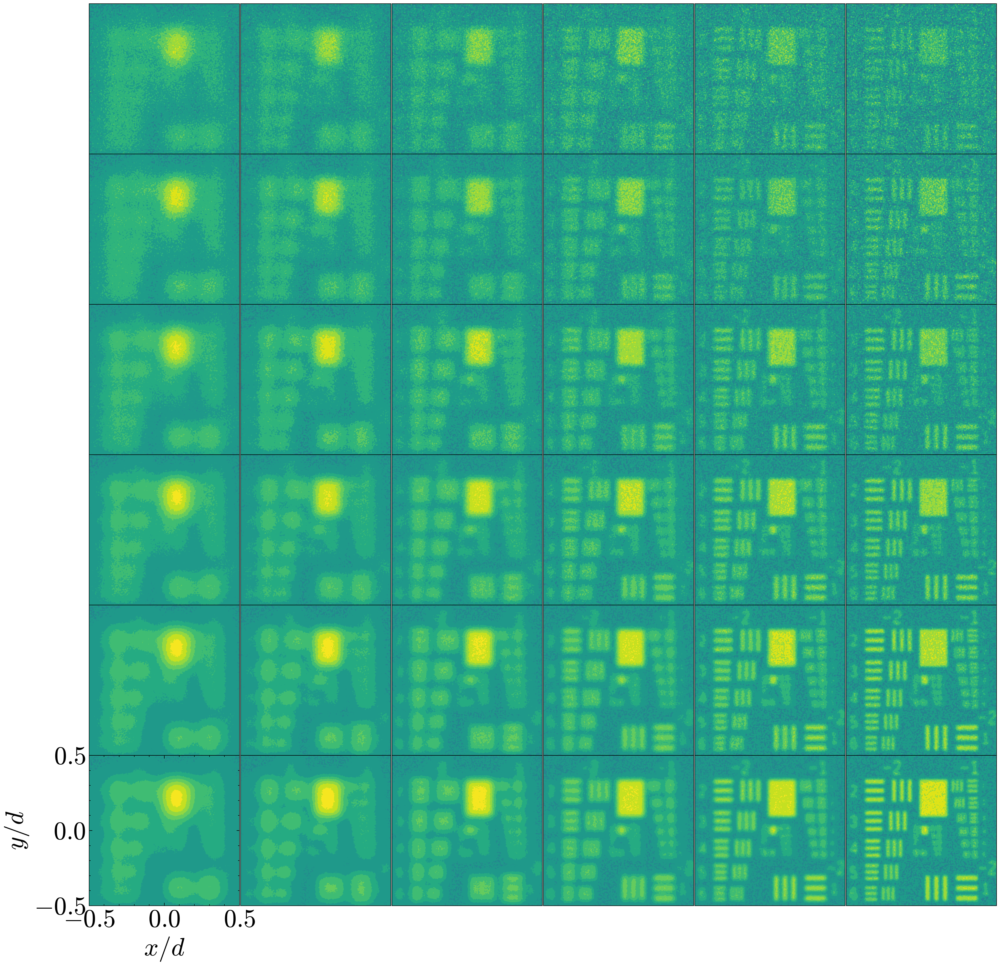

Recovered images:


<Figure size 1500x900 with 0 Axes>

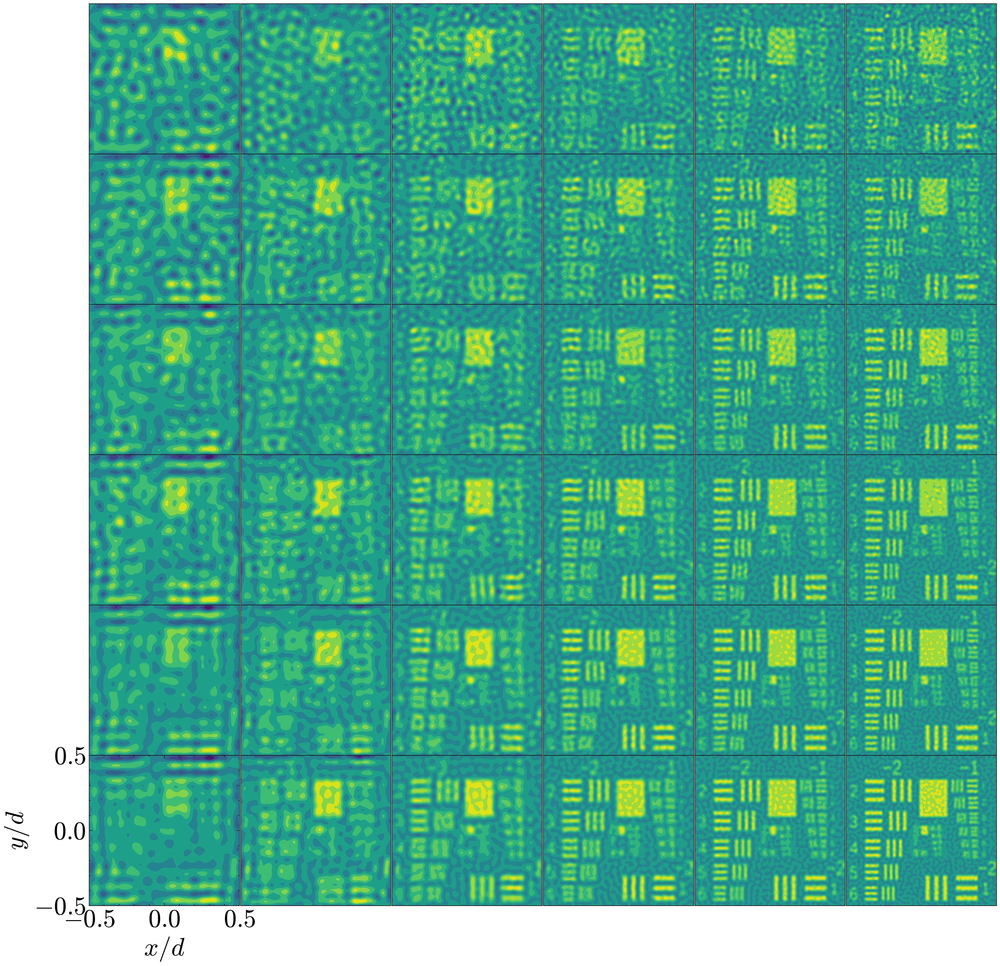

In [24]:
photon=100
Nbprime=0

filenameString_list=[
'data/test_binary_coh_quantum_bp_dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

plotnameString_list=[
'plots/dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

for idx in range(len(filenameString_list)):
  myplot_6x6_denserd(filenameString_list[idx],plotnameString_list[idx])

### Noisy

PSNR:
x:d= [ 20.          28.25075089  39.9052463   56.36765863  79.62143411
 112.46826504]
y:G= [  1.           2.51188643   6.30957344  15.84893192  39.81071706
 100.        ]
PSNR= [[ 6.50439232  7.52520293  8.76228774  9.69793988  9.91626808  9.91991295]
 [ 7.42547631  8.24491668  9.67396263 10.82320401 11.6372249  11.64064627]
 [ 7.58976858  9.35201412 10.35826703 11.58083813 12.39538546 12.7135794 ]
 [ 7.32787841  9.58958479 10.92417981 12.03467629 13.04758413 13.27411994]
 [ 7.5192783   9.63504692 11.06976546 12.17377236 13.16356548 13.59166726]
 [ 7.38329524  9.5216167  11.05650686 12.28804128 13.16203486 13.83779908]]


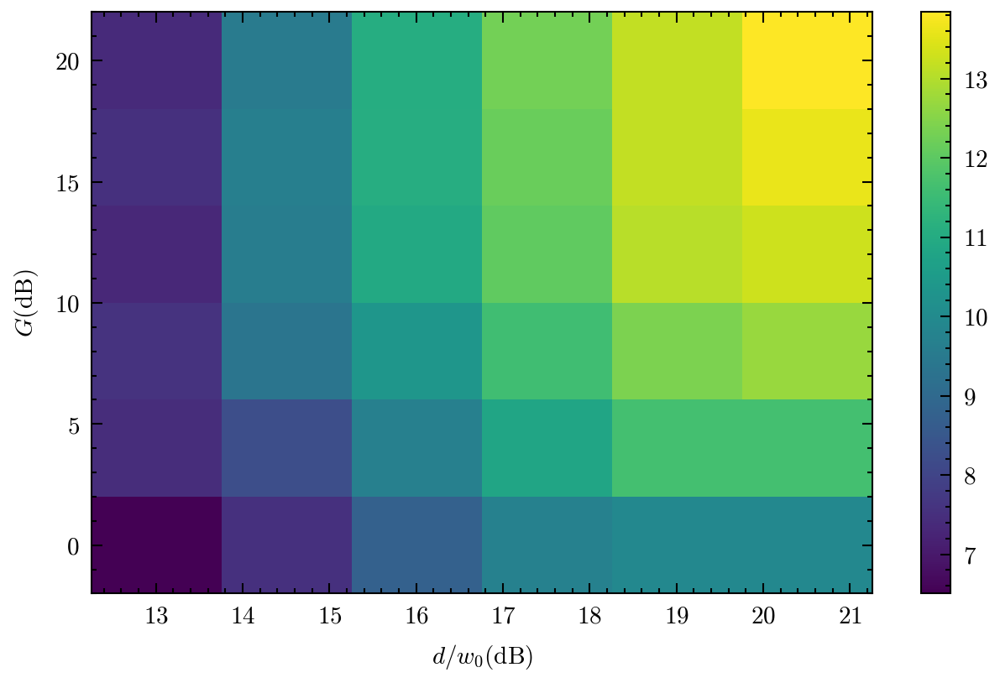

Raw images:


<Figure size 1500x900 with 0 Axes>

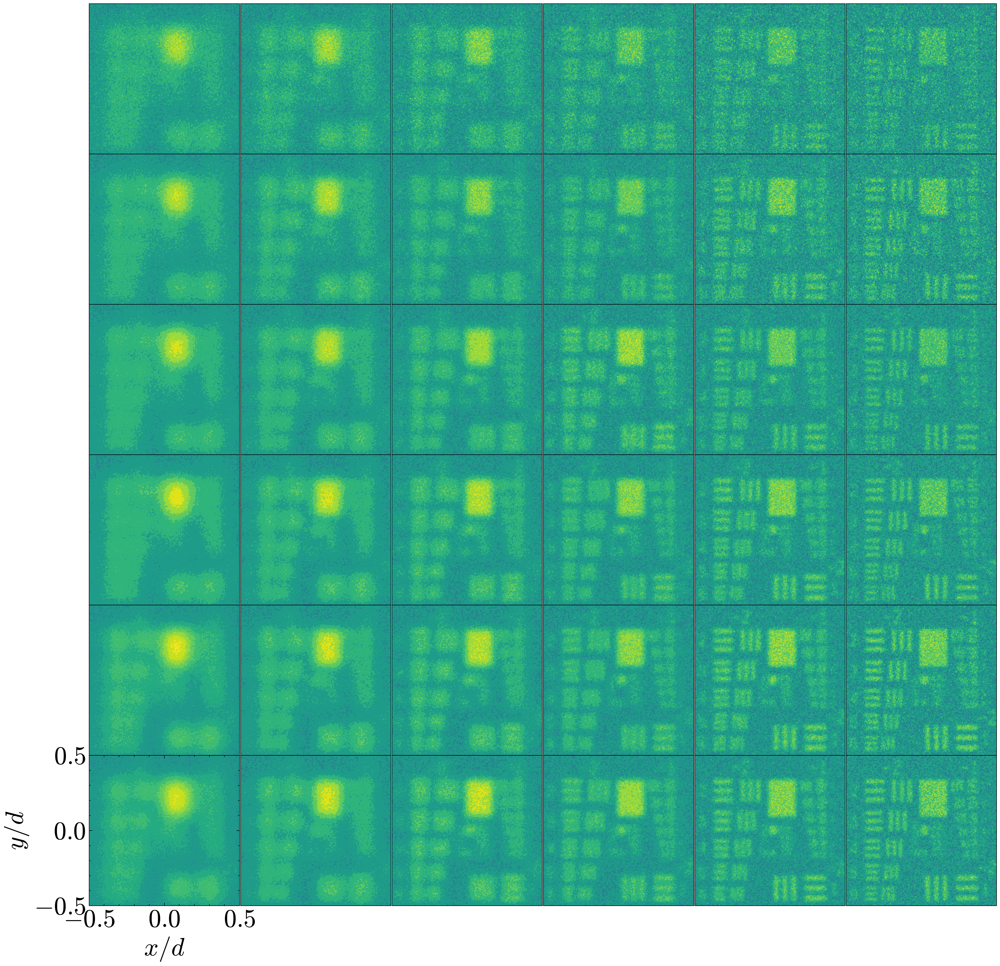

Recovered images:


<Figure size 1500x900 with 0 Axes>

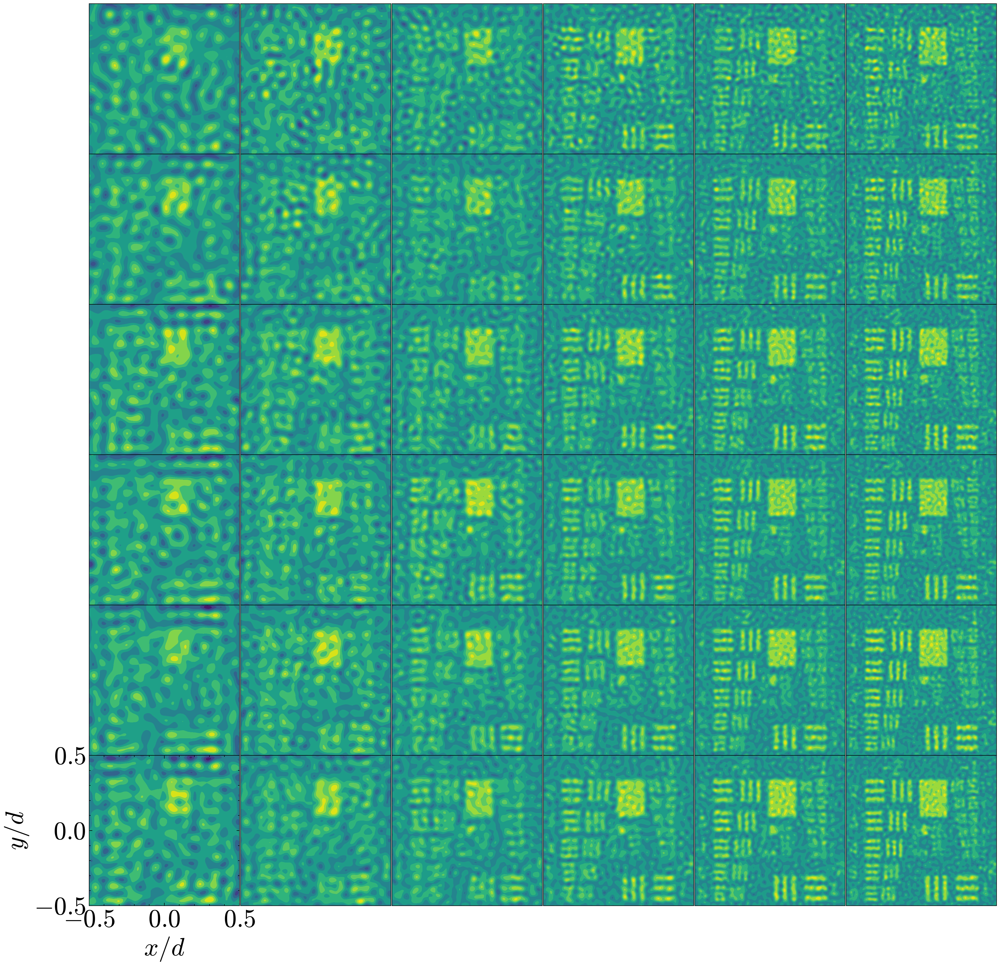

In [23]:
photon=100
Nbprime=0.1

filenameString_list=[
'data/test_binary_coh_quantum_bp_dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

plotnameString_list=[
'plots/dmSNRcontour_adaptiveGrid_USAF1951_photon=%i_Nbprime=%f'%(photon,Nbprime)
]

for idx in range(len(filenameString_list)):
  myplot_6x6_denserd(filenameString_list[idx],plotnameString_list[idx])